-   [Mass spectrometry and proteomics data
    analysis](#mass-spectrometry-and-proteomics-data-analysis)
    -   [Setup](#setup)
    -   [Introduction](#introduction)
    -   [Exploring available
        infrastructure](#exploring-available-infrastructure)
    -   [Mass spectrometry data](#mass-spectrometry-data)
    -   [Getting data from proteomics
        repositories](#getting-data-from-proteomics-repositories)
    -   [Handling raw MS data](#handling-raw-ms-data)
    -   [Handling identification data](#handling-identification-data)
    -   [MS/MS database search](#msms-database-search)
    -   [Analysing search results](#analysing-search-results)
    -   [High-level data interface](#high-level-data-interface)
    -   [Quantitative proteomics](#quantitative-proteomics)
    -   [Importing third-party quantitation
        data](#importing-third-party-quantitation-data)
    -   [Data processing and analysis](#data-processing-and-analysis)
        -   [Raw data processing](#raw-data-processing)
        -   [Processing and
            normalisation](#processing-and-normalisation)
    -   [Statistical analysis](#statistical-analysis)
        -   [Classification](#classification)
        -   [Clustering](#clustering)
    -   [Annotation](#annotation)
    -   [Other relevant
        packages/pipelines](#other-relevant-packagespipelines)
    -   [Session information](#session-information)

Mass spectrometry and proteomics data analysis
==============================================

Setup
-----

The follow packages will be used throughout this documents. R version `3.1.1` or higher is required to install all the packages using `BiocInstaller::biocLite`.

In [1]:
library("mzR")
library("mzID")
library("MSnID")
library("MSnbase")
library("rpx")
library("MLInterfaces")
library("pRoloc")
library("pRolocdata")
library("MSGFplus")
library("rols")
library("hpar")

Loading required package: Rcpp
Warning message:
: replacing previous import by ‘data.table::melt’ when loading ‘MSnID’Warning message:
: replacing previous import by ‘data.table::dcast’ when loading ‘MSnID’Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, as.vector, cbind, colnames,
    do.call, duplicated, eval, evalq, Filter, Find, get, grep, grepl,
    intersect, is.unsorted, lapply, lengths, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, set

The most convenient way to install all the tutorials requirement (and more related content), is to install [`RforProteomics`](http://www.bioconductor.org/packages/release/data/experiment/html/RforProteomics.html) with all its dependencies.

``` r
library("BiocInstaller")
biocLite("RforProteomics", dependencies = TRUE)
```

Other packages of interest, such as [`rTANDEM`](http://www.bioconductor.org/packages/release/bioc/html/rTANDEM.html) or [`MSGFgui`](http://www.bioconductor.org/packages/release/bioc/html/MSGFgui.html) will be described later in the document but are not required to execute the code in this workflow.

Introduction
------------

This workflow illustrates R / Bioconductor infrastructure for proteomics. Topics covered focus on support for open community-driven formats for raw data and identification results, packages for peptide-spectrum matching, data processing and analysis:

-   Exploring available infrastructure
-   Mass spectrometry data
-   Getting data from proteomics repositories
-   Handling raw MS data
-   Handling identification data
-   MS/MS database search
-   Analysing search results
-   High-level data interface
-   Quantitative proteomics
-   Importing third-party quantitation data
-   Data processing and analysis
-   Statistical analysis
-   Machine learning
-   Annotation
-   Other relevant packages/pipelines

Links to other packages and references are also documented. In particular, the vignettes included in the [`RforProteomics`](http://www.bioconductor.org/packages/release/data/experiment/html/RforProteomics.html) package also contains relevant material.

Exploring available infrastructure
----------------------------------

In Bioconductor version 3.2, there are respectively 79 [proteomics](http://bioconductor.org/packages/release/BiocViews.html#___Proteomics), 55 [mass spectrometry software packages](http://bioconductor.org/packages/release/BiocViews.html#___MassSpectrometry) and 12 [mass spectrometry experiment packages](http://bioconductor.org/packages/release/BiocViews.html#___MassSpectrometryData). These respective packages can be extracted with the `proteomicsPackages()`, `massSpectrometryPackages()` and `massSpectrometryDataPackages()` and explored interactively.

``` r
library("RforProteomics")
pp <- proteomicsPackages()
display(pp)
```

Mass spectrometry data
----------------------

Most community-driven formats are supported in `R`, as detailed in the table below.

| Type           | Format                      | Package                                                                                                                                                       |
|:---------------|:----------------------------|:--------------------------------------------------------------------------------------------------------------------------------------------------------------|
| raw            | mzML, mzXML, netCDF, mzData | [`mzR`](http://bioconductor.org/packages/release/bioc/html/mzR.html) (read)                                                                                   |
| identification | mzIdentML                   | [`mzR`](http://bioconductor.org/packages/release/bioc/html/mzR.html) (read) and [`mzID`](http://bioconductor.org/packages/release/bioc/html/mzID.html) (read) |
| quantitation   | mzQuantML                   |                                                                                                                                                               |
| peak lists     | mgf                         | [`MSnbase`](http://bioconductor.org/packages/release/bioc/html/MSnbase.html) (read/write)                                                                     |
| other          | mzTab                       | [`MSnbase`](http://bioconductor.org/packages/release/bioc/html/MSnbase.html) (read/write)                                                                     |

Getting data from proteomics repositories
-----------------------------------------

MS-based proteomics data is disseminated through the [ProteomeXchange](http://www.proteomexchange.org/) infrastructure, which centrally coordinates submission, storage and dissemination through multiple data repositories, such as the [PRIDE](https://www.ebi.ac.uk/pride/archive/) data base at the EBI for MS/MS experiments, [PASSEL](http://www.peptideatlas.org/passel/) at the ISB for SRM data and the [MassIVE](http://massive.ucsd.edu/ProteoSAFe/static/massive.jsp) resource. The [`rpx`](http://www.bioconductor.org/packages/release/bioc/html/rpx.html) is an interface to ProteomeXchange and provides a basic access to PX data.

In [2]:
library("rpx")
pxannounced()

15 new ProteomeXchange annoucements


,Data.Set,Publication.Data,Message
1,PXD001489,2015-12-15 00:43:02,New
2,PXD001488,2015-12-14 20:40:22,New
3,PXD003123,2015-12-14 16:34:19,New
4,PXD001452,2015-12-14 16:32:04,New
5,PXD001451,2015-12-14 16:12:55,New
6,PXD000760,2015-12-14 15:53:07,New
7,PXD000908,2015-12-14 13:15:40,New
8,PXD003183,2015-12-11 10:03:45,New
9,PXD002694,2015-12-11 09:31:58,New
10,PXD003214,2015-12-11 08:53:14,New


Using the unique `PXD000001` identifier, we can retrieve the relevant metadata that will be stored in a `PXDataset` object. The names of the files available in this data can be retrieved with the `pxfiles` accessor function.

In [3]:
px <- PXDataset("PXD000001")
px
pxfiles(px)

Object of class "PXDataset"
 Id: PXD000001 with 10 files
 [1] 'F063721.dat' ... [10] 'erwinia_carotovora.fasta'
 Use 'pxfiles(.)' to see all files.

[1] "F063721.dat"                                                         
 [2] "F063721.dat-mztab.txt"                                               
 [3] "PRIDE_Exp_Complete_Ac_22134.xml.gz"                                  
 [4] "PRIDE_Exp_mzData_Ac_22134.xml.gz"                                    
 [5] "PXD000001_mztab.txt"                                                 
 [6] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML" 
 [7] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzXML"
 [8] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01.mzXML"         
 [9] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01.raw"           
[10] "erwinia_carotovora.fasta"

Other metadata for the `px` data set:

In [4]:
pxtax(px)
pxurl(px)
pxref(px)

[1] "Erwinia carotovora"

[1] "ftp://ftp.pride.ebi.ac.uk/pride/data/archive/2012/03/PXD000001"

[1] "Gatto L, Christoforou A. Using R and Bioconductor for proteomics data analysis. Biochim Biophys Acta. 2014 Jan;1844(1 Pt A):42-51. Review"

Data files can then be downloaded with the `pxget` function. Below, we retrieve the sixth file, TMT\_Erwinia\_1uLSike\_Top10HCD\_isol2\_45stepped\_60min\_01-20141210.mzML. The file is downloaded in the working directory and the name of the file is return by the function and stored in the `mzf` variable for later use.

In [5]:
mzf <- pxget(px, pxfiles(px)[6])
mzf

TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML already present.


[1] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML"

Handling raw MS data
--------------------

The `mzR` package provides an interface to the [proteowizard](http://proteowizard.sourceforge.net/) C/C++ code base to access various raw data files, such as `mzML`, `mzXML`, `netCDF`, and `mzData`. The data is accessed on-disk, i.e it is not loaded entirely in memory by default but only when explicitly requested. The three main functions are `openMSfile` to create a file handle to a raw data file, `header` to extract metadata about the spectra contained in the file and `peaks` to extract one or multiple spectra of interest. Other functions such as `instrumentInfo`, or `runInfo` can be used to gather general information about a run.

Below, we access the raw data file downloaded in the previous section and open a file handle that will allow us to extract data and metadata of interest.

In [6]:
library("mzR")
ms <- openMSfile(mzf)
ms

Mass Spectrometry file handle.
Filename:  TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML 
Number of scans:  7534 

The `header` function returns the metadata of all available peaks:

In [7]:
hd <- header(ms)
dim(hd)
names(hd)

[1] 7534   21

[1] "seqNum"                   "acquisitionNum"          
 [3] "msLevel"                  "polarity"                
 [5] "peaksCount"               "totIonCurrent"           
 [7] "retentionTime"            "basePeakMZ"              
 [9] "basePeakIntensity"        "collisionEnergy"         
[11] "ionisationEnergy"         "lowMZ"                   
[13] "highMZ"                   "precursorScanNum"        
[15] "precursorMZ"              "precursorCharge"         
[17] "precursorIntensity"       "mergedScan"              
[19] "mergedResultScanNum"      "mergedResultStartScanNum"
[21] "mergedResultEndScanNum"

We can extract metadata and scan data for scan 1000 as follows:

,seqNum,acquisitionNum,msLevel,polarity,peaksCount,totIonCurrent,retentionTime,basePeakMZ,basePeakIntensity,collisionEnergy,ellip.h,lowMZ,highMZ,precursorScanNum,precursorMZ,precursorCharge,precursorIntensity,mergedScan,mergedResultScanNum,mergedResultStartScanNum,mergedResultEndScanNum
1000,1000,1000,2,-1,274,1048554,1106.916,136.061,164464,45,⋯,104.5467,1370.758,992,683.0817,2,689443.7,0,0,0,0


104.5467,308.9326
104.5684,308.6961
108.8340,346.7183
109.3928,365.1236
110.0345,616.7905
110.0703,429.1975


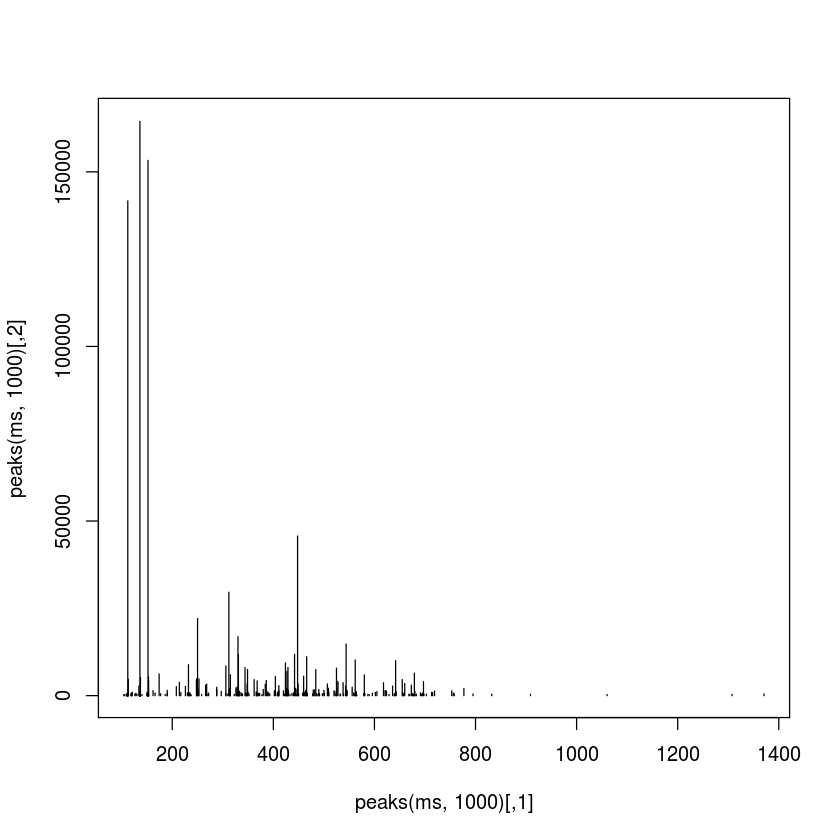

In [8]:
hd[1000, ]
head(peaks(ms, 1000))
plot(peaks(ms, 1000), type = "h")

Below we reproduce the example from the `MSmap` function from the `MSnbase` package to plot a specific slice of the raw data using the `mzR` functions we have just described.

1


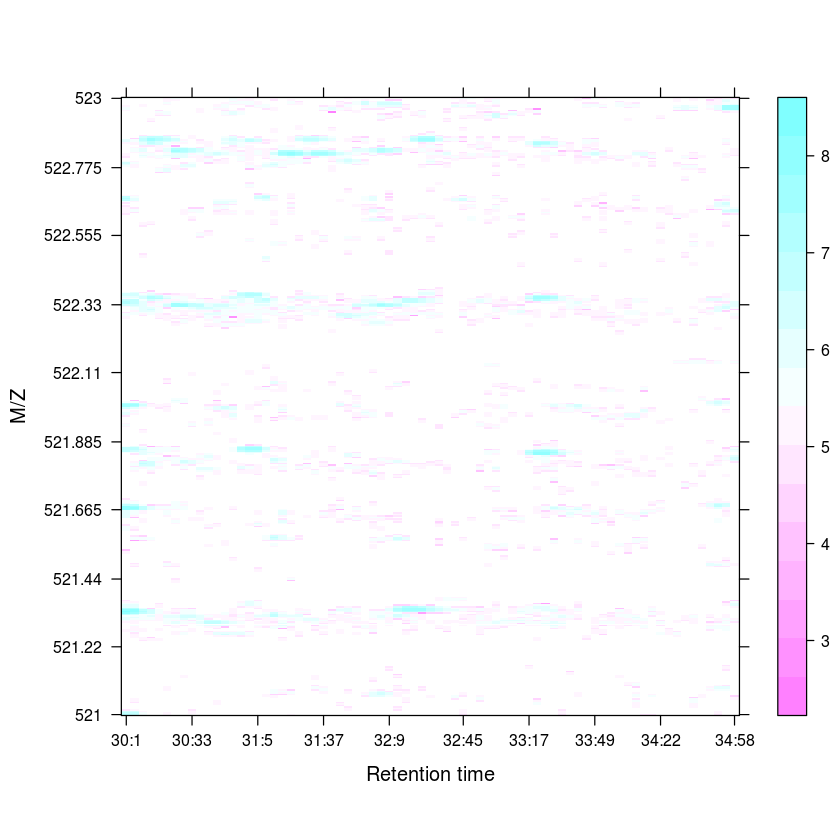

In [9]:
## a set of spectra of interest: MS1 spectra eluted
## between 30 and 35 minutes retention time
ms1 <- which(hd$msLevel == 1)
rtsel <- hd$retentionTime[ms1] / 60 > 30 &
    hd$retentionTime[ms1] / 60 < 35

## the map
M <- MSmap(ms, ms1[rtsel], 521, 523, .005, hd)

plot(M, aspect = 1, allTicks = FALSE)

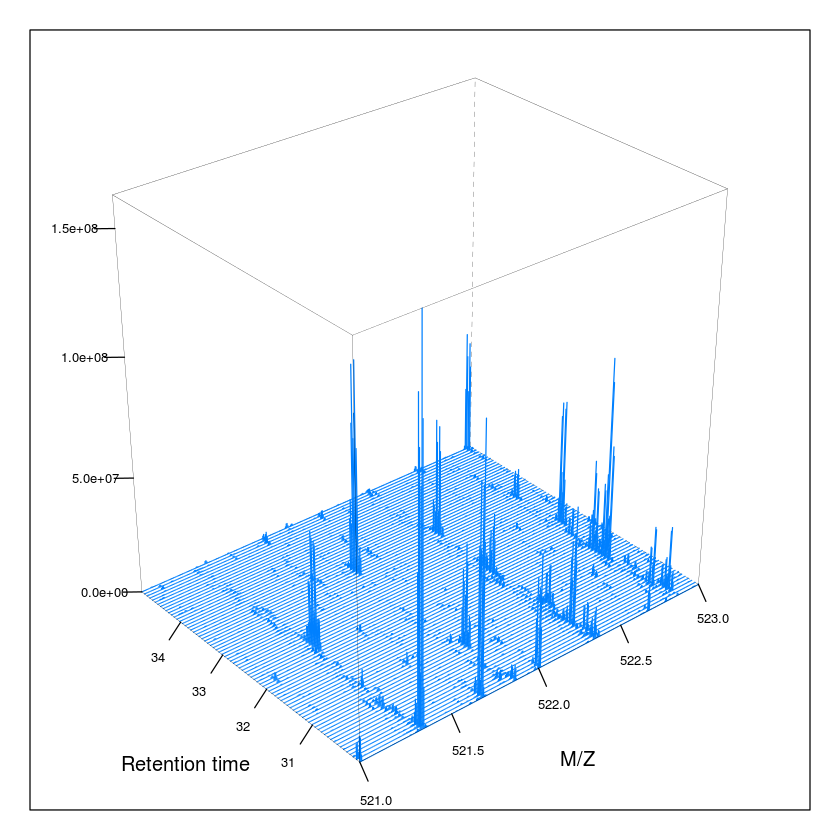

In [10]:
plot3D(M)

1


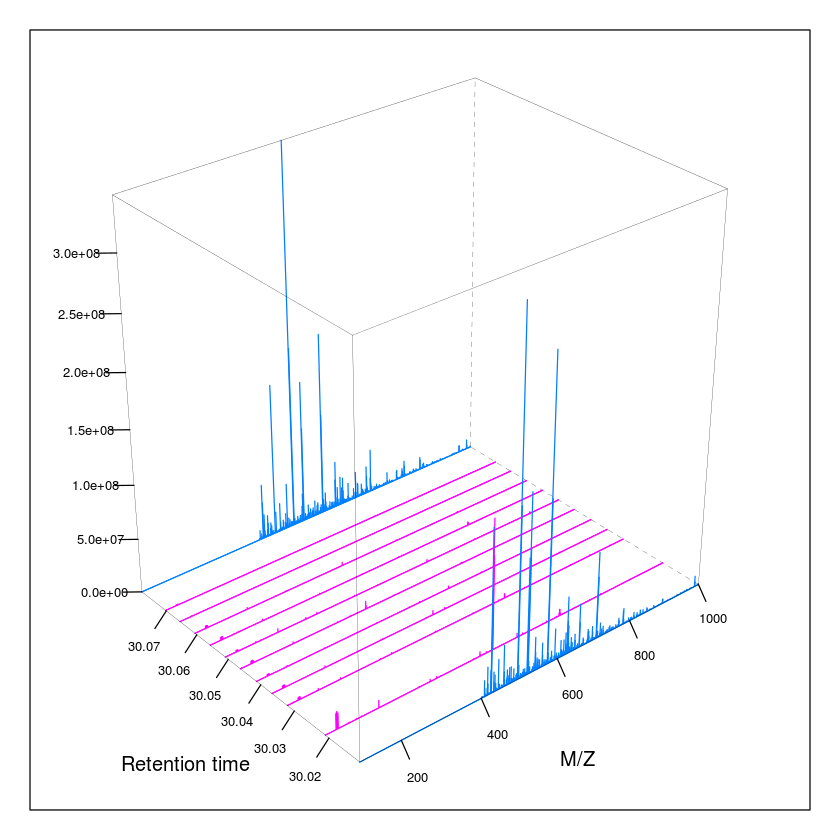

In [11]:
## With some MS2 spectra
i <- ms1[which(rtsel)][1]
j <- ms1[which(rtsel)][2]
M2 <- MSmap(ms, i:j, 100, 1000, 1, hd)
plot3D(M2)

Handling identification data
----------------------------

The `RforProteomics` package distributes a small identification result file (see `?TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01.mzid`) that we load and parse using infrastructure from the [`mzID`](http://bioconductor.org/packages/release/bioc/html/mzID.html) package.

In [12]:
library("mzID")
f <- dir(system.file("extdata", package = "RforProteomics"),
         pattern = "mzid", full.names=TRUE)
basename(f)
id <- mzID(f)
id

[1] "TMT_Erwinia.mzid.gz"

reading TMT_Erwinia.mzid.gz... DONE!


An mzID object

Software used:   MS-GF+ (version: Beta (v10072))

Rawfile:         /home/lgatto/dev/00_github/RforProteomics/sandbox/TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01.mzXML

Database:        /home/lgatto/dev/00_github/RforProteomics/sandbox/erwinia_carotovora.fasta

Number of scans: 5287
Number of PSM's: 5563

Various data can be extracted from the `mzID` object, using one the accessor functions such as `database`, `scans`, `peptides`, ... The object can also be converted into a `data.frame` using the `flatten` function.

The `mzR` package also provides support fast parsing `mzIdentML` files with the `openIDfile` function. As for raw data, the underlying C/C++ code comes from the [proteowizard](http://proteowizard.sourceforge.net/).

In [13]:
library("mzR")
f <- dir(system.file("extdata", package = "RforProteomics"),
         pattern = "mzid", full.names=TRUE)

id1 <- openIDfile(f)
fid1 <- mzR::psms(id1)

head(fid1)

,spectrumID,chargeState,rank,passThreshold,experimentalMassToCharge,calculatedMassToCharge,sequence,modNum,isDecoy,post,pre,start,end,DatabaseAccess,DBseqLength,DatabaseSeq,DatabaseDescription,acquisitionNum
1,scan=5782,3,1,TRUE,1080.233,1080.232,PVQIQAGEDSNVIGALGGAVLGGFLGNTIGGGSGR,0,FALSE,S,R,50,84,ECA1932,155,,ECA1932 outer membrane lipoprotein,5782
2,scan=6037,3,1,TRUE,1002.209,1002.212,TQVLDGLINANDIEVPVALIDGEIDVLR,0,FALSE,R,K,288,315,ECA1147,434,,ECA1147 trigger factor,6037
3,scan=5235,3,1,TRUE,1189.284,1189.28,TKGLNVMQNLLTAHPDVQAVFAQNDEMALGALR,0,FALSE,A,R,192,224,ECA0013,295,,ECA0013 ribose-binding periplasmic protein,5235
4,scan=5397,3,1,TRUE,960.5365,960.5365,SQILQQAGTSVLSQANQVPQTVLSLLR,0,FALSE,-,R,264,290,ECA1731,290,,ECA1731 flagellin,5397
5,scan=6075,3,1,TRUE,1264.341,1264.342,PIIGDNPFVVVLPDVVLDESTADQTQENLALLISR,0,FALSE,F,R,119,153,ECA1443,298,,ECA1443 UTP--glucose-1-phosphate uridylyltransferase,6075
6,scan=5761,2,1,TRUE,1268.643,1268.65,WTSQSSLDLGEPLSLITESVFAR,0,FALSE,Y,K,264,286,ECA1444,468,,"ECA1444 6-phosphogluconate dehydrogenase, decarboxylating",5761


MS/MS database search
---------------------

While searches are generally performed using third-party software independently of R or can be started from R using a `system` call, the [`rTANDEM`](http://www.bioconductor.org/packages/release/bioc/html/rTANDEM.html) package allows one to execute such searches using the X!Tandem engine. The [`shinyTANDEM`](http://www.bioconductor.org/packages/release/bioc/html/shinyTANDEM.html) provides an experimental interactive interface to explore the search results.

``` r
library("rTANDEM")
?rtandem
library("shinyTANDEM")
?shinyTANDEM
```

Similarly, the [`MSGFplus`](http://www.bioconductor.org/packages/release/bioc/html/MSGFplus.html) package enables to perform a search using the MSGF+ engine, as illustrated below.

We search the TMT\_Erwinia\_1uLSike\_Top10HCD\_isol2\_45stepped\_60min\_01-20141210.mzML file against the fasta file from `PXD000001` using `MSGFplus`.

We first download the fasta files:

In [14]:
fas <- pxget(px, pxfiles(px)[10])
basename(fas)

erwinia_carotovora.fasta already present.


[1] "erwinia_carotovora.fasta"

In [15]:
library("MSGFplus")
msgfpar <- msgfPar(database = fas,
                   instrument = 'HighRes',
                   tda = TRUE,
                   enzyme = 'Trypsin',
                   protocol = 'iTRAQ')
idres <- runMSGF(msgfpar, mzf, memory=1000)
idres
## identification file (needed below)
basename(mzID::files(idres)$id)

java -Xmx1000M -jar '/home/msmith/Applications/R/R-3.2.2/library/MSGFplus/MSGFPlus/MSGFPlus.jar' -s 'TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML' -o '/mnt/data/biocworkflows/build/proteomics/TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzid' -d 'erwinia_carotovora.fasta' -tda 1 -inst 1 -e 1 -protocol 2 

reading TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzid... DONE!


An mzID object

Software used:   MS-GF+ (version: Beta (v10072))

Rawfile:         /mnt/data/biocworkflows/build/proteomics/TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzML

Database:        /mnt/data/biocworkflows/build/proteomics/erwinia_carotovora.fasta

Number of scans: 5343
Number of PSM's: 5656

[1] "TMT_Erwinia_1uLSike_Top10HCD_isol2_45stepped_60min_01-20141210.mzid"

(Note that in the `runMSGF` call above, I explicitly reduce the memory allocated to the java virtual machine to 3.5GB. In general, there is no need to specify this argument, unless you experience an error regarding the *maximum heap size*).

A graphical interface to perform the search the data and explore the results is also available:

``` r
library("MSGFgui")
MSGFgui()
```

Analysing search results
------------------------

The [`MSnID`](http://bioconductor.org/packages/release/bioc/html/MSnID.html) package can be used for post-search filtering of MS/MS identifications. One starts with the construction of an `MSnID` object that is populated with identification results that can be imported from a `data.frame` or from `mzIdenML` files.

In [16]:
library("MSnID")
msnid <- MSnID(".")
msnid <- read_mzIDs(msnid,
                    basename(mzID::files(idres)$id))
show(msnid)

Note, the anticipated/suggested columns in the
peptide-to-spectrum matching results are:
-----------------------------------------------
accession
calculatedMassToCharge
chargeState
experimentalMassToCharge
isDecoy
peptide
spectrumFile
spectrumID
Loaded cached data



MSnID object
Working directory: "."
#Spectrum Files:  1 
#PSMs: 5759 at 100 % FDR
#peptides: 4942 at 99 % FDR
#accessions: 3148 at 100 % FDR


The package then enables to define, optimise and apply filtering based for example on missed cleavages, identification scores, precursor mass errors, etc. and assess PSM, peptide and protein FDR levels. Below, we start by apply a correction of monoisotopic peaks (see `?correct_peak_selection` for details) and define two variables to be used for identification filtering.

In [17]:
msnid <- correct_peak_selection(msnid)
msnid$msmsScore <- -log10(msnid$`MS-GF:SpecEValue`)
msnid$absParentMassErrorPPM <- abs(mass_measurement_error(msnid))

As shown below, this particular spiked-in data set displays few high scoring non-decoy hits

We define a filter object, assigning arbitrary threshold and evaluate it on the `msnid` data

In [18]:
filtObj <- MSnIDFilter(msnid)
filtObj$absParentMassErrorPPM <- list(comparison="<", threshold=5.0)
filtObj$msmsScore <- list(comparison=">", threshold=8.0)
filtObj

evaluate_filter(msnid, filtObj)

MSnIDFilter object
(absParentMassErrorPPM < 5) & (msmsScore > 8) 

,fdr,n
PSM,0.04545455,23.00000000
peptide,0.0625,17.0000
accession,0.05882353,18.00000000


We can also optimise the filtering with a target protein FDR value of 0.01

In [19]:
filtObj.grid <- optimize_filter(filtObj, msnid, fdr.max=0.01,
                                method="Grid", level="PSM",
                                n.iter=50000)
filtObj.grid
evaluate_filter(msnid, filtObj.grid)

MSnIDFilter object
(absParentMassErrorPPM < 12) & (msmsScore > 8.1) 

,fdr,n
PSM,0,39
peptide,0,31
accession,0,26


We can now apply the filter to the data

In [20]:
msnid <- apply_filter(msnid, filtObj.grid)
msnid

MSnID object
Working directory: "."
#Spectrum Files:  1 
#PSMs: 39 at 0 % FDR
#peptides: 31 at 0 % FDR
#accessions: 26 at 0 % FDR

The resulting data can be exported to a `data.frame` or to a dedicated `MSnSet` data structure for quantitative MS data, described below, and further processed and analyses using appropriate statistical tests.

High-level data interface
-------------------------

The above sections introduced low-level interfaces to raw and identification results. The [`MSnbase`](http://bioconductor.org/packages/release/bioc/html/MSnbase.html) package provides abstractions for raw data through the `MSnExp` class and containers for quantification data via the `MSnSet` class. Both store

1.  the actual assay data (spectra or quantitation matrix, see below), accessed with `spectra` (or the `[`, `[[` operators) or `exprs`;
2.  sample metadata, accessed as a `data.frame` with `pData`;
3.  feature metadata, accessed as a `data.frame` with `fData`.

<!-- `]]`, `]` -->
Another useful slot is `processingData`, accessed with `processingData(.)`, that records all the processing that objects have undergone since their creation (see examples below).

The `readMSData` will parse the raw data, extract the MS2 spectra (by default) and construct an MS experiment object of class `MSnExp`.

(Note that while `readMSData` supports MS1 data, this is currently not convenient as all the data is read into memory.)

In [21]:
library("MSnbase")
rawFile <- dir(system.file(package = "MSnbase", dir = "extdata"),
               full.name = TRUE, pattern = "mzXML$")
basename(rawFile)
msexp <- readMSData(rawFile, verbose = FALSE)
msexp

[1] "dummyiTRAQ.mzXML"

Object of class "MSnExp"
 Object size in memory: 0.2 Mb
- - - Spectra data - - -
 MS level(s): 2 
 Number of MS1 acquisitions: 1 
 Number of MSn scans: 5 
 Number of precursor ions: 5 
 4 unique MZs
 Precursor MZ's: 437.8 - 716.34 
 MSn M/Z range: 100 2016.66 
 MSn retention times: 25:1 - 25:2 minutes
- - - Processing information - - -
Data loaded: Tue Dec 15 16:23:36 2015 
 MSnbase version: 1.18.0 
- - - Meta data  - - -
phenoData
  rowNames: 1
  varLabels: sampleNames
  varMetadata: labelDescription
Loaded from:
  dummyiTRAQ.mzXML 
protocolData: none
featureData
  featureNames: X1.1 X2.1 ... X5.1 (5 total)
  fvarLabels: spectrum
  fvarMetadata: labelDescription
experimentData: use 'experimentData(object)'

MS2 spectra can be extracted as a list of `Spectrum2` objects with the `spectra` accessor or as a subset of the original `MSnExp` data with the `[` operator. Individual spectra can be accessed with `[[`.

In [22]:
length(msexp)
msexp[1:2]
msexp[[2]]

[1] 5

Object of class "MSnExp"
 Object size in memory: 0.09 Mb
- - - Spectra data - - -
 MS level(s): 2 
 Number of MS1 acquisitions: 1 
 Number of MSn scans: 2 
 Number of precursor ions: 2 
 2 unique MZs
 Precursor MZ's: 546.96 - 645.37 
 MSn M/Z range: 100 2016.66 
 MSn retention times: 25:1 - 25:2 minutes
- - - Processing information - - -
Data loaded: Tue Dec 15 16:23:36 2015 
Data [numerically] subsetted 2 spectra: Tue Dec 15 16:23:36 2015 
 MSnbase version: 1.18.0 
- - - Meta data  - - -
phenoData
  rowNames: 1
  varLabels: sampleNames
  varMetadata: labelDescription
Loaded from:
  dummyiTRAQ.mzXML 
protocolData: none
featureData
  featureNames: X1.1 X2.1
  fvarLabels: spectrum
  fvarMetadata: labelDescription
experimentData: use 'experimentData(object)'

Object of class "Spectrum2"
 Precursor: 546.9586 
 Retention time: 25:2 
 Charge: 3 
 MSn level: 2 
 Peaks count: 1012 
 Total ion count: 56758067 

The identification results stemming from the same raw data file can then be used to add PSM matches.

In [23]:
fData(msexp)
## find path to a mzIdentML file
identFile <- dir(system.file(package = "MSnbase", dir = "extdata"),
                 full.name = TRUE, pattern = "dummyiTRAQ.mzid")
basename(identFile)
msexp <- addIdentificationData(msexp, identFile)
fData(msexp)

,spectrum
X1.1,1
X2.1,2
X3.1,3
X4.1,4
X5.1,5


[1] "dummyiTRAQ.mzid"

reading dummyiTRAQ.mzid... DONE!


,spectrum,scan number(s),passthreshold,rank,calculatedmasstocharge,experimentalmasstocharge,chargestate,ms-gf:denovoscore,ms-gf:evalue,ms-gf:rawscore,ellip.h,description,pepseq,modified,modification,idFile,databaseFile,nprot,npep.prot,npsm.prot,npsm.pep
X1.1,1,1,TRUE,1,645.0375,645.3741,3,77,79.36958,-39,⋯,DNA mismatch repair protein;acetolactate synthase isozyme III large subunit,VESITARHGEVLQLRPK,FALSE,NA,dummyiTRAQ.mzid,erwinia_carotovora.fasta,2,1,1,1
X2.1,2,2,TRUE,1,546.9633,546.9586,3,39,13.46615,-30,⋯,"2,3,4,5-tetrahydropyridine-2,6-dicarboxylate N-succinyltransferase",IDGQWVTHQWLKK,FALSE,NA,dummyiTRAQ.mzid,erwinia_carotovora.fasta,1,1,1,1
X3.1,3,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
X4.1,4,NA,NA,NA,NA,NA,NA,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
X5.1,5,5,TRUE,1,437.2997,437.804,2,5,366.3842,-42,⋯,putative capsular polysacharide biosynthesis transferase,LVILLFR,FALSE,NA,dummyiTRAQ.mzid,erwinia_carotovora.fasta,1,1,1,1


The `readMSData` and `addIdentificationData` make use of `mzR` and `mzID` packages to access the raw and identification data.

Spectra and (parts of) experiments can be extracted and plotted.

Object of class "Spectrum2"
 Precursor: 645.3741 
 Retention time: 25:1 
 Charge: 3 
 MSn level: 2 
 Peaks count: 2921 
 Total ion count: 668170086 

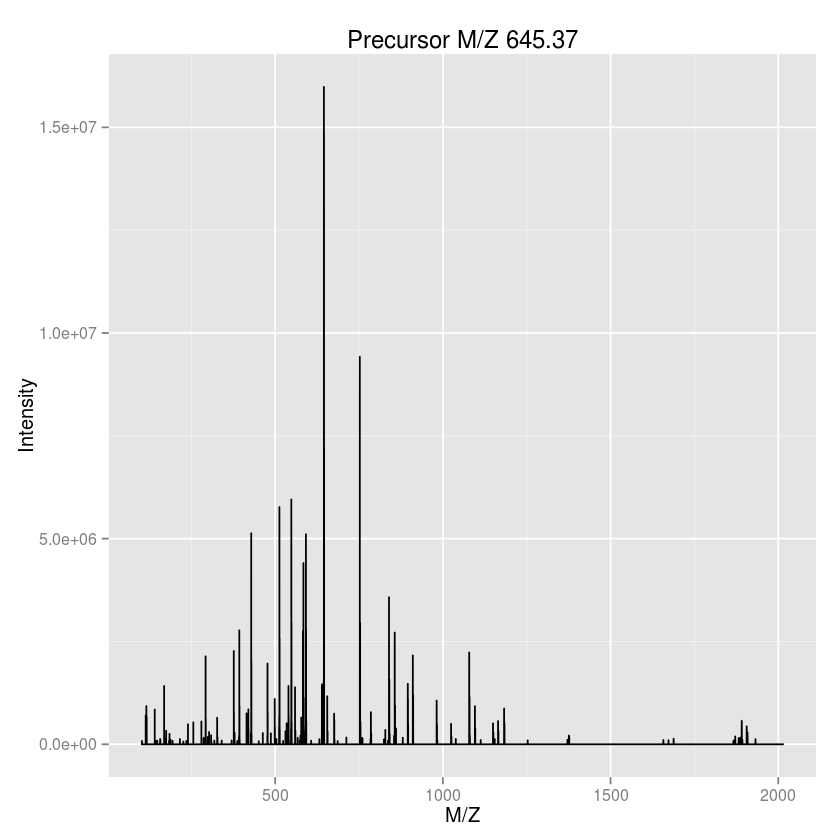

In [24]:
msexp[[1]]
plot(msexp[[1]], full=TRUE)

Object of class "MSnExp"
 Object size in memory: 0.13 Mb
- - - Spectra data - - -
 MS level(s): 2 
 Number of MS1 acquisitions: 1 
 Number of MSn scans: 3 
 Number of precursor ions: 3 
 2 unique MZs
 Precursor MZ's: 546.96 - 645.37 
 MSn M/Z range: 100 2016.66 
 MSn retention times: 25:1 - 25:2 minutes
- - - Processing information - - -
Data loaded: Tue Dec 15 16:23:36 2015 
Data [numerically] subsetted 3 spectra: Tue Dec 15 16:23:37 2015 
 MSnbase version: 1.18.0 
- - - Meta data  - - -
phenoData
  rowNames: 1
  varLabels: sampleNames
  varMetadata: labelDescription
Loaded from:
  dummyiTRAQ.mzXML 
protocolData: none
featureData
  featureNames: X1.1 X2.1 X3.1
  fvarLabels: spectrum scan number(s) ... npsm.pep (30 total)
  fvarMetadata: labelDescription
experimentData: use 'experimentData(object)'

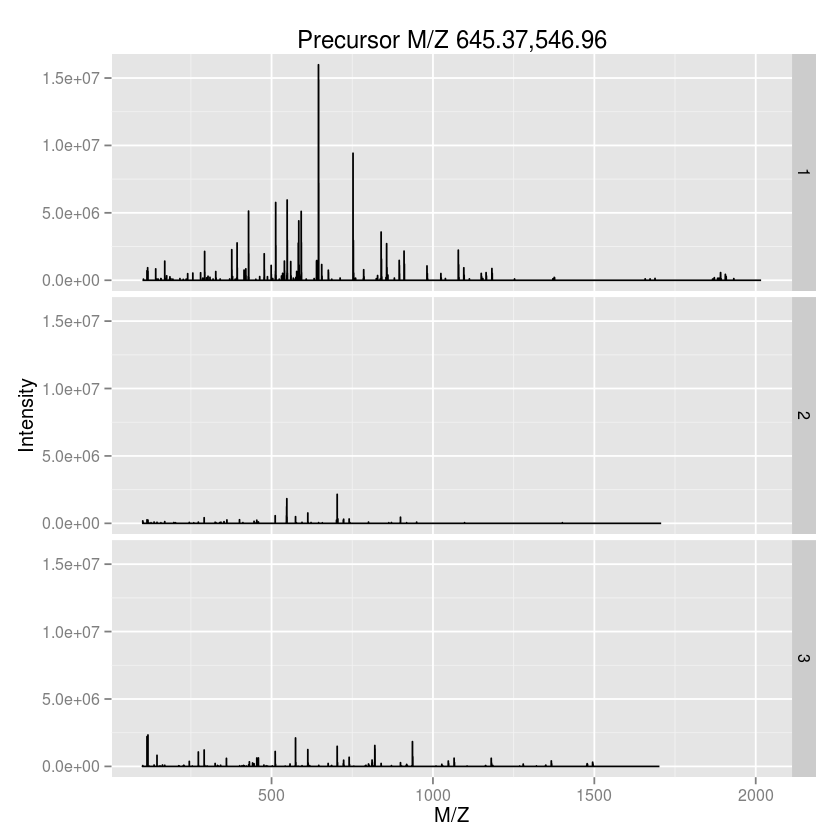

In [25]:
msexp[1:3]
plot(msexp[1:3], full=TRUE)

Quantitative proteomics
-----------------------

There are a wide range of proteomics quantitation techniques that can broadly be classified as labelled vs. label-free, depending whether the features are labelled prior the MS acquisition and the MS level at which quantitation is inferred, namely MS1 or MS2.

|     | Label-free | Labelled   |
|-----|:-----------|:-----------|
| MS1 | XIC        | SILAC, 15N |
| MS2 | Counting   | iTRAQ, TMT |

In terms of raw data quantitation, most efforts have been devoted to MS2-level quantitation. Label-free XIC quantitation has however been addressed in the frame of metabolomics data processing by the [`xcms`](http://bioconductor.org/packages/release/bioc/html/xcms.html) infrastructure.

An `MSnExp` is converted to an `MSnSet` by the `quantitation` method. Below, we use the iTRAQ 4-plex isobaric tagging strategy (defined by the `iTRAQ4` parameter; other tags are available) and the `trapezoidation` method to calculate the area under the isobaric reporter peaks.

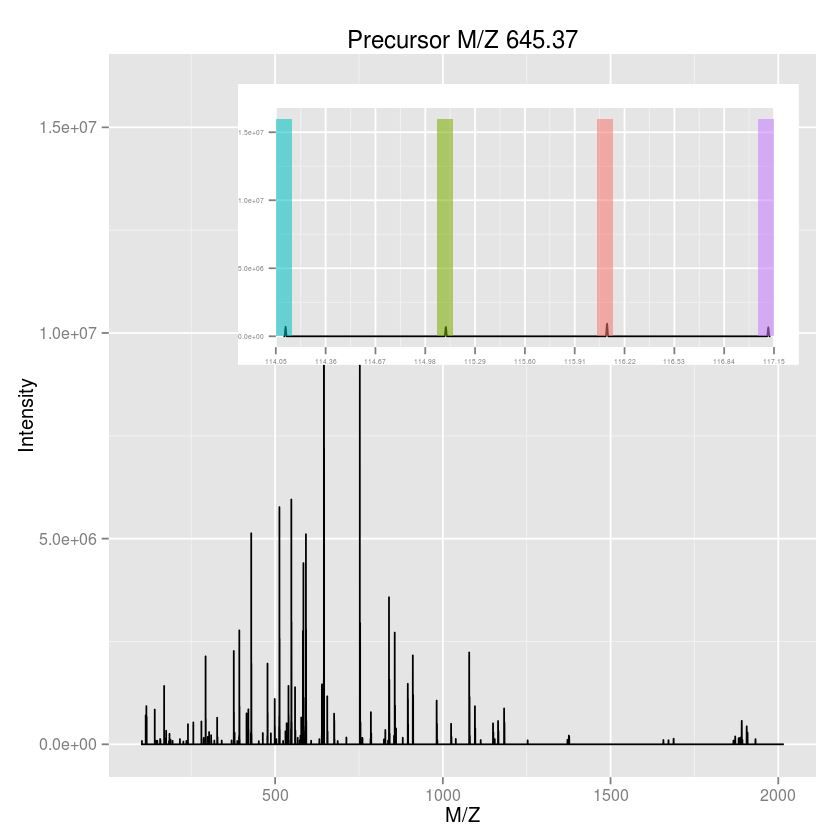

In [26]:
plot(msexp[[1]], full=TRUE, reporters = iTRAQ4)

In [27]:
msset <- quantify(msexp, method = "trap", reporters = iTRAQ4, verbose=FALSE)
exprs(msset)
processingData(msset)

,iTRAQ4.114,iTRAQ4.115,iTRAQ4.116,iTRAQ4.117
X1.1,4483.320,4873.996,6743.441,4601.378
X2.1,1918.082,1418.040,1117.601,1581.954
X3.1,15210.98,15296.26,15592.76,16550.50
X4.1,4133.103,5069.983,4724.845,4694.801
X5.1,11947.88,13061.87,12809.49,12911.48


- - - Processing information - - -
Data loaded: Tue Dec 15 16:23:36 2015 
iTRAQ4 quantification by trapezoidation: Tue Dec 15 16:23:40 2015 
 MSnbase version: 1.18.0 

Other MS2 quantitation methods available in `quantify` include the (normalised) spectral index `SI` and (normalised) spectral abundance factor `SAF` or simply a simple count method.

In [28]:
exprs(si <- quantify(msexp, method = "SIn"))     
exprs(saf <- quantify(msexp, method = "NSAF"))

,1
ECA0510,0.003588641
ECA1028,0.001470129


,1
ECA0510,0.6235828
ECA1028,0.3764172


Note that spectra that have not been assigned any peptide (`NA`) or that match non-unique peptides (`npsm > 1`) are discarded in the counting process.

**See also** The [`isobar`](http://www.bioconductor.org/packages/release/bioc/html/isobar.html) package supports quantitation from centroided `mgf` peak lists or its own tab-separated files that can be generated from Mascot and Phenyx vendor files.

Importing third-party quantitation data
---------------------------------------

The PSI `mzTab` file format is aimed at providing a simpler (than XML formats) and more accessible file format to the wider community. It is composed of a key-value metadata section and peptide/protein/small molecule tabular sections.

In [29]:
mztf <- pxget(px, pxfiles(px)[2])
(mzt <- readMzTabData(mztf, what = "PEP"))

F063721.dat-mztab.txt already present.


MSnSet (storageMode: lockedEnvironment)
assayData: 1528 features, 0 samples 
  element names: exprs 
protocolData: none
phenoData: none
featureData
  featureNames: DGVSVAR NVVLDK ... IDPILVTDMDTLPELLSQALR (1528 total)
  fvarLabels: sequence accession ... peptide_abundance_sub.6. (20
    total)
  fvarMetadata: labelDescription
experimentData: use 'experimentData(object)'
Annotation:  
- - - Processing information - - -
 MSnbase version: 1.18.0 

It is also possible to import arbitrary spreadsheets as `MSnSet` objects into R with the `readMSnSet2` function. The main 2 arguments of the function are (1) a text-based spreadsheet and (2) column names of indices that identify the quantitation data. The latter can be queried with the `getEcols` function.

In [30]:
csv <- dir(system.file ("extdata" , package = "pRolocdata"),
           full.names = TRUE, pattern = "pr800866n_si_004-rep1.csv")
getEcols(csv, split = ",")
ecols <- 7:10
res <- readMSnSet2(csv, ecols)
head(exprs(res))
head(fData(res))

[1] "\"Protein ID\""              "\"FBgn\""                   
 [3] "\"Flybase Symbol\""          "\"No. peptide IDs\""        
 [5] "\"Mascot score\""            "\"No. peptides quantified\""
 [7] "\"area 114\""                "\"area 115\""               
 [9] "\"area 116\""                "\"area 117\""               
[11] "\"PLS-DA classification\""   "\"Peptide sequence\""       
[13] "\"Precursor ion mass\""      "\"Precursor ion charge\""   
[15] "\"pd.2013\""                 "\"pd.markers\""

,area.114,area.115,area.116,area.117
1,0.379,0.281,0.225,0.114
2,0.420000,0.209667,0.206111,0.163889
3,0.187333,0.167333,0.169667,0.476000
4,0.2475,0.2530,0.3200,0.1790
5,0.216,0.183,0.342,0.259
6,0.072000,0.212333,0.573000,0.142667


,Protein.ID,FBgn,Flybase.Symbol,No..peptide.IDs,Mascot.score,No..peptides.quantified,PLS.DA.classification,Peptide.sequence,Precursor.ion.mass,Precursor.ion.charge,pd.2013,pd.markers
1,CG10060,FBgn0001104,G-ialpha65A,3,179.86,1,PM,,,,PM,unknown
2,CG10067,FBgn0000044,Act57B,5,222.4,9,PM,,,,PM,unknown
3,CG10077,FBgn0035720,CG10077,5,219.65,3,,,,,unknown,unknown
4,CG10079,FBgn0003731,Egfr,2,86.39,2,PM,,,,PM,unknown
5,CG10106,FBgn0029506,Tsp42Ee,1,52.1,1,,GGVFDTIQK,626.887,2,Phenotype 1,unknown
6,CG10130,FBgn0010638,Sec61beta,2,79.9,3,ER/Golgi,,,,ER/Golgi,ER


Data processing and analysis
----------------------------

### Raw data processing

For raw data processing look at `MSnbase`'s `clean`, `smooth`, `pickPeaks`, `removePeaks` and `trimMz` for `MSnExp` and spectra processing methods.

The [`MALDIquant`](http://cran.r-project.org/web/packages/MALDIquant/index.html) and [`xcms`](http://bioconductor.org/packages/release/bioc/html/xcms.html) packages also features a wide range of raw data processing methods on their own ad hoc data instance types.

### Processing and normalisation

Each different types of quantitative data will require their own pre-processing and normalisation steps. Both `isobar` and `MSnbase` allow to correct for isobaric tag impurities normalise the quantitative data.

In [31]:
data(itraqdata)
qnt <- quantify(itraqdata, method = "trap",
                reporters = iTRAQ4, verbose = FALSE)
impurities <- matrix(c(0.929,0.059,0.002,0.000,
                       0.020,0.923,0.056,0.001,
                       0.000,0.030,0.924,0.045,
                       0.000,0.001,0.040,0.923),
                     nrow=4, byrow = TRUE)
## or, using makeImpuritiesMatrix()
## impurities <- makeImpuritiesMatrix(4)
qnt.crct <- purityCorrect(qnt, impurities)
processingData(qnt.crct)

- - - Processing information - - -
Data loaded: Wed May 11 18:54:39 2011 
iTRAQ4 quantification by trapezoidation: Tue Dec 15 16:23:47 2015 
Purity corrected: Tue Dec 15 16:23:47 2015 
 MSnbase version: 1.1.22 

Various normalisation methods can be applied the `MSnSet` instances using the `normalise` method: variance stabilisation (`vsn`), quantile (`quantiles`), median or mean centring (`center.media` or `center.mean`), ...

In [32]:
qnt.crct.nrm <- normalise(qnt.crct, "quantiles") 

The `combineFeatures` method combines spectra/peptides quantitation values into protein data. The grouping is defined by the `groupBy` parameter, which is generally taken from the feature metadata (protein accessions, for example).

In [33]:
## arbitraty grouping
g <- factor(c(rep(1, 25), rep(2, 15), rep(3, 15)))
g
prt <- combineFeatures(qnt.crct.nrm, groupBy = g, fun = "sum")
processingData(prt)

[1] 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2
[39] 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
Levels: 1 2 3

Combined 55 features into 3 using sum


- - - Processing information - - -
Data loaded: Wed May 11 18:54:39 2011 
iTRAQ4 quantification by trapezoidation: Tue Dec 15 16:23:47 2015 
Purity corrected: Tue Dec 15 16:23:47 2015 
Normalised (quantiles): Tue Dec 15 16:23:47 2015 
Combined 55 features into 3 using sum: Tue Dec 15 16:23:47 2015 
 MSnbase version: 1.1.22 

Finally, proteomics data analysis is generally hampered by missing values. Missing data imputation is a sensitive operation whose success will be guided by many factors, such as degree and (non-)random nature of the missingness.

Below, missing values are randomly assigned to our test data and visualised on a heatmap.


FALSE  TRUE 
  209    11 

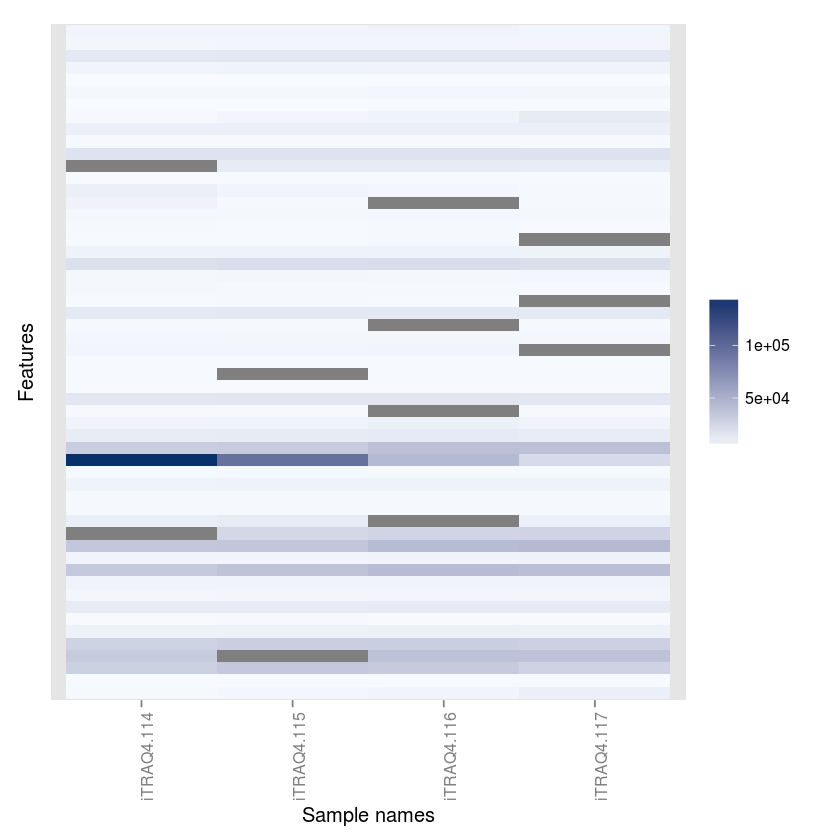

In [34]:
set.seed(1)
qnt0 <- qnt
exprs(qnt0)[sample(prod(dim(qnt0)), 10)] <- NA
table(is.na(qnt0))
image(qnt0)

Missing value in `MSnSet` instances can be filtered out and imputed using the `filterNA` and `impute` functions.

In [35]:
## remove features with missing values
qnt00 <- filterNA(qnt0)
dim(qnt00)
any(is.na(qnt00))

[1] 44  4

[1] FALSE

In [36]:
## impute missing values using knn imputation
qnt.imp <- impute(qnt0, method = "knn")
dim(qnt.imp)
any(is.na(qnt.imp))

[1] 55  4

[1] FALSE

There are various methods to perform data imputation, as described in `?impute`.

Statistical analysis
--------------------

R in general and Bioconductor in particular are well suited for the statistical analysis of data. Several packages provide dedicated resources for proteomics data:

-   [`MSstats`](http://www.bioconductor.org/packages/release/bioc/html/MSstats.html): A set of tools for statistical relative protein significance analysis in DDA, SRM and DIA experiments. Data stored in `data.frame` or `MSnSet` objects can be used as input.

-   [`msmsTest`](http://www.bioconductor.org/packages/release/bioc/html/msmsTests.html): Statistical tests for label-free LC-MS/MS data by spectral counts, to discover differentially expressed proteins between two biological conditions. Three tests are available: Poisson GLM regression, quasi-likelihood GLM regression, and the negative binomial of the [`edgeR`](http://www.bioconductor.org/packages/release/bioc/html/edgeR.html) package. All can be readily applied on `MSnSet` instances produced, for example by `MSnID`.

-   [`isobar`](http://www.bioconductor.org/packages/release/bioc/html/isobar.html) also provides dedicated infrastructure for the statistical analysis of isobaric data.

n\#\# Machine learning

The [`MLInterfaces`](http://www.bioconductor.org/packages/release/bioc/html/MLInterfaces.html) package provides a unified interface to a wide range of machine learning algorithms. Initially developed for microarray and `ExpressionSet` instances, the [`pRoloc`](http://www.bioconductor.org/packages/release/bioc/html/pRoloc.html) package enables application of these algorithms to `MSnSet` data.

### Classification

The example below uses `knn` with the 5 closest neighbours as an illustration to classify proteins of unknown sub-cellular localisation to one of 9 possible organelles.

In [37]:
library("MLInterfaces")
library("pRoloc")
library("pRolocdata")
data(dunkley2006)
traininds <- which(fData(dunkley2006)$markers != "unknown")
ans <- MLearn(markers ~ ., data = t(dunkley2006), knnI(k = 5), traininds)
ans

MLInterfaces classification output container
The call was:
MLearn(formula = markers ~ ., data = t(dunkley2006), .method = knnI(k = 5), 
    trainInd = traininds)
Predicted outcome distribution for test set:

     ER lumen   ER membrane         Golgi Mitochondrion       Plastid 
            5           140            67            51            29 
           PM      Ribosome           TGN       vacuole 
           89            31             6            10 
Summary of scores on test set (use testScores() method for details):
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.4000  1.0000  1.0000  0.9332  1.0000  1.0000 

### Clustering

#### kmeans

clusteringOutput: partition table

  1   2   3   4   5   6   7   8   9  10  11  12 
 55  28  29  18  60  30  44 145  78 116  33  53 
The call that created this object was:
MLearn(formula = ~., data = dunkley2006, .method = kmeansI, centers = 12)

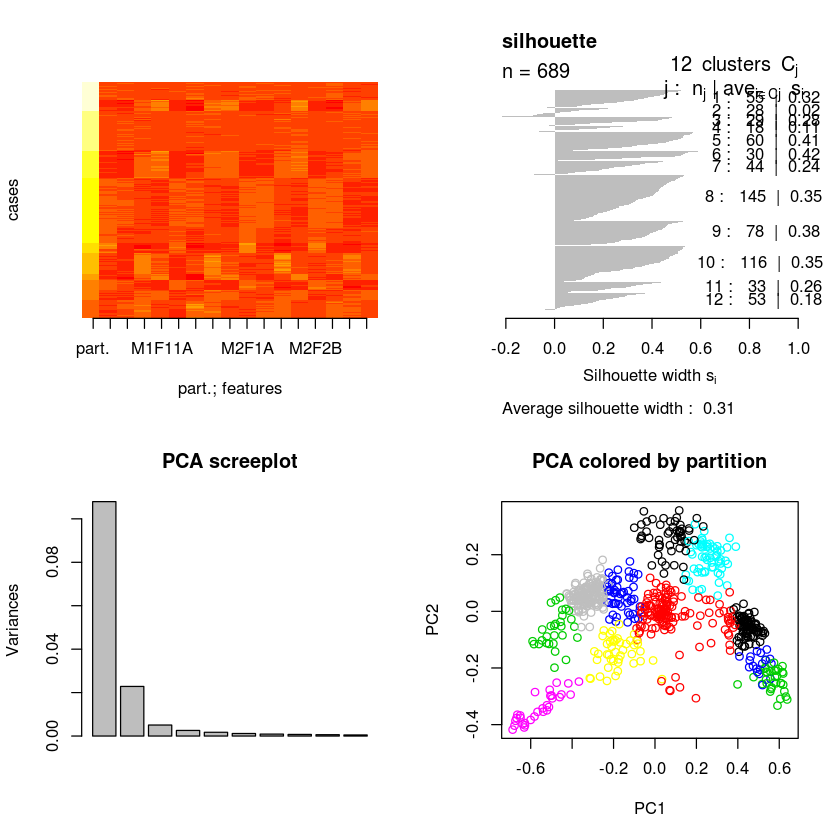

In [38]:
kcl <- MLearn( ~ ., data = dunkley2006, kmeansI, centers = 12)
kcl
plot(kcl, exprs(dunkley2006))

A wide range of classification and clustering algorithms are also available, as described in the `?MLearn` documentation page. The `pRoloc` package also uses `MSnSet` instances as input and ,while being conceived with the analysis of spatial/organelle proteomics data in mind, is applicable many use cases.

Annotation
----------

All the [Bioconductor annotation infrastructure](http://bioconductor.org/help/workflows/annotation/annotation/), such as [`biomaRt`](http://bioconductor.org/packages/release/bioc/html/biomaRt.html), [`GO.db`](http://www.bioconductor.org/packages/release/data/annotation/html/GO.db.html), organism specific annotations, .. are directly relevant to the analysis of proteomics data. A total of 93 ontologies, including some proteomics-centred annotations such as the PSI Mass Spectrometry Ontology, Molecular Interaction (PSI MI 2.5) or Protein Modifications are available through the [`rols`](http://www.bioconductor.org/packages/release/bioc/html/rols.html).

In [39]:
library("rols")
olsQuery("ESI", "MS")

Found more than one class "connection" in cache; using the first, from namespace 'BiocGenerics'
Found more than one class "connection" in cache; using the first, from namespace 'BiocGenerics'
Found more than one class "connection" in cache; using the first, from namespace 'BiocGenerics'
Found more than one class "connection" in cache; using the first, from namespace 'BiocGenerics'


MS:1000073  MS:1000162 
      "ESI" "HiRes ESI"

Data from the [Human Protein Atlas](http://www.proteinatlas.org/) is available via the [`hpar`](http://www.bioconductor.org/packages/release/bioc/html/hpar.html) package.

Other relevant packages/pipelines
---------------------------------

-   Analysis of post translational modification with [`isobar`](http://www.bioconductor.org/packages/release/bioc/html/isobar.html).
-   Analysis of label-free data from a Synapt G2 (including ion mobility) with [`synapter`](http://www.bioconductor.org/packages/release/bioc/html/synapter.html).
-   Analysis of spatial proteomics data with [`pRoloc`](http://www.bioconductor.org/packages/release/bioc/html/pRoloc.html).
-   Analysis of MALDI data with the [`MALDIquant`](http://cran.r-project.org/web/packages/MALDIquant/index.html) package.
-   Access to the Proteomics Standard Initiative Common QUery InterfaCe with the [`PSICQUIC`](http://www.bioconductor.org/packages/release/bioc/html/PSICQUIC.html) package.

Additional relevant packages are described in the [`RforProteomics`](http://www.bioconductor.org/packages/release/data/experiment/html/RforProteomics.html) vignettes.

Session information
-------------------